## Problem Definition
Humans have an innate ability to distinguish between a horse, dog, a cat, and a flying saucer with ease. However, this process is far more challenging for a computer to replicate, as it appears effortless only because of the intricate design of our brains that allows us to recognize images. A common example of image recognition with machine learning is optical character recognition. In this project,We will go through the process of constructing an Image Recognition model with Machine Learning using PyTorch.

## What is PyTorch?
Before we delve into the project we can get to understand the definition of PyTorch. PyTorch is a library for Python programs that make it easy to create deep learning models. Like Python does for programming, PyTorch provides a great introduction to deep learning.For the image recognition task, in this project, I will be using the TorchVision package which contains some of the best performing neural network architectures for computer vision, such as AlexNet. It also provides easy access to datasets like ImageNet and other utilities to learn about computer vision applications in PyTorch.

The predefined models can be found in torchvision.models:

In [1]:
from torchvision import models
dir(models)

['AlexNet',
 'AlexNet_Weights',
 'ConvNeXt',
 'ConvNeXt_Base_Weights',
 'ConvNeXt_Large_Weights',
 'ConvNeXt_Small_Weights',
 'ConvNeXt_Tiny_Weights',
 'DenseNet',
 'DenseNet121_Weights',
 'DenseNet161_Weights',
 'DenseNet169_Weights',
 'DenseNet201_Weights',
 'EfficientNet',
 'EfficientNet_B0_Weights',
 'EfficientNet_B1_Weights',
 'EfficientNet_B2_Weights',
 'EfficientNet_B3_Weights',
 'EfficientNet_B4_Weights',
 'EfficientNet_B5_Weights',
 'EfficientNet_B6_Weights',
 'EfficientNet_B7_Weights',
 'EfficientNet_V2_L_Weights',
 'EfficientNet_V2_M_Weights',
 'EfficientNet_V2_S_Weights',
 'GoogLeNet',
 'GoogLeNetOutputs',
 'GoogLeNet_Weights',
 'Inception3',
 'InceptionOutputs',
 'Inception_V3_Weights',
 'MNASNet',
 'MNASNet0_5_Weights',
 'MNASNet0_75_Weights',
 'MNASNet1_0_Weights',
 'MNASNet1_3_Weights',
 'MaxVit',
 'MaxVit_T_Weights',
 'MobileNetV2',
 'MobileNetV3',
 'MobileNet_V2_Weights',
 'MobileNet_V3_Large_Weights',
 'MobileNet_V3_Small_Weights',
 'RegNet',
 'RegNet_X_16GF_Weights'

The uppercase names refer to Python classes that implement several popular models. Lowercase names are handy functions that return patterns instantiated from these classes, sometimes with different sets of parameters.

## AlexNet
To run the AlexNet architecture on an input image, we can create an instance of the AlexNet class. Here’s how we can do it:

In [2]:
alexnet = models.AlexNet()

At this stage, AlexNet is an object that runs the AlexNet architecture. It is not essential for us to understand the intricate details of this architecture at this time. For now, AlexNet is simply an opaque object that can be called as a function.

By providing AlexNet with precisely sized input data, we will be able to perform a direct transfer across the network. In other words, the input will be processed by the first set of neurons, the outputs of which will be passed on to the next set of neurons, until the final output is generated. This process is a powerful way to quickly and accurately process data.

## ResNet
By using the resnet101 method, we can now instantiate a 101-layer convolutional neural network. Now let’s create an instance of the network. We’re going to pass an argument that will ask the function to download the resnet101 weights formed on the ImageNet dataset, with 1.2 million images and 1000 categories:

In [3]:
resnet = models.resnet101(pretrained=True)
resnet

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth


  0%|          | 0.00/171M [00:00<?, ?B/s]

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

Now, the resnet variable can be called as a function. Before we can do that, however, we need to preprocess the input images so that they are the correct size and their values ​​(colours) are roughly in the same numeric range. To do this, we need to use the torchvision module which provides transformations, which will allow us to quickly define pipelines of basic preprocessing functions

In [4]:
from torchvision import transforms
preprocess = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )])

In this case, we have defined a preprocessing function that will scale the input image to 256 × 256, crop the image to 224 × 224 around the centre, turn it into a tensor, and normalize its RGB components. (red, green, blue) so that they have defined means and standard deviations.

## Image Recognition
Now we can use an image for the image recognition task using our model. I took a picture of a dog. We can start by loading an image from the local filesystem using Pillow, an image manipulation module for Python:

Saving pexels-pixabay-46505.jpg to pexels-pixabay-46505 (1).jpg


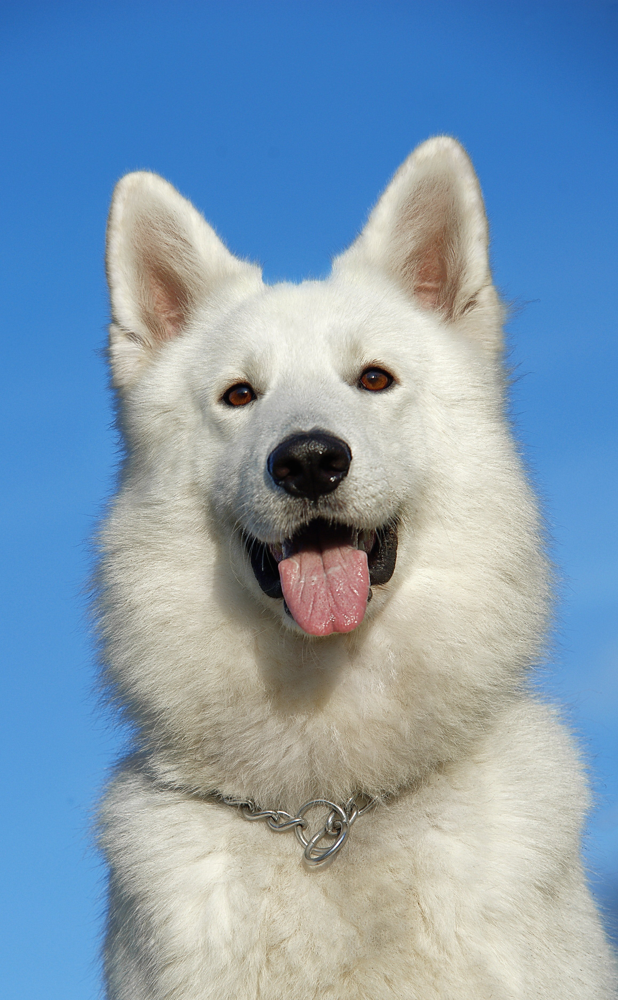

In [14]:
from google.colab import files
uploaded = files.upload()
from PIL import Image
img = Image.open("/content/pexels-pixabay-46505.jpg")
img

Next, we need to pass the image through our preprocessing pipeline for image recognition: 

In [15]:
img_t = preprocess(img)

Now we can reshape, crop, and normalize the input tensor in the way the network expects:

In [16]:
import torch
batch_t = torch.unsqueeze(img_t, 0)
resnet.eval()
out = resnet(batch_t)
out

tensor([[-2.3070e+00, -1.8177e+00,  1.4200e+00,  1.1326e+00, -1.9256e+00,
          1.5222e+00, -2.0762e-02, -1.9673e+00,  1.7489e-01, -1.4307e+00,
         -4.4871e-01, -3.9573e-01, -2.0472e-01,  9.7258e-01, -1.9985e+00,
         -1.8310e+00,  1.4060e-01,  1.9210e+00,  5.1126e-02,  2.0338e+00,
         -1.0421e+00, -5.6867e-01, -1.0988e+00,  7.3853e-01, -2.8927e-01,
         -1.9325e+00, -2.5337e+00, -2.2258e+00, -1.5535e+00, -1.1487e+00,
         -4.3841e-01, -1.7727e+00, -2.6527e+00, -1.4727e+00, -1.8093e+00,
         -2.2456e+00, -2.5225e+00, -3.7166e+00, -2.2494e+00, -2.1169e+00,
         -6.0408e-01, -2.9878e+00, -1.2798e+00, -3.1535e+00, -1.3970e+00,
         -1.6908e+00, -4.5198e-01, -8.1223e-01, -4.3193e+00, -1.9977e+00,
          1.4200e-01, -1.3144e+00, -7.0304e-01, -9.3070e-01, -8.0038e-01,
         -4.7119e-01, -2.0267e+00,  1.8633e-02, -1.2135e+00, -2.0821e+00,
          1.0097e-01, -2.5239e+00, -2.1609e+00, -1.8302e+00, -9.3305e-01,
         -4.7702e-01, -2.5877e-01, -2.

## Run The Image Recognition Model
The process of running a trained model on new data is called inference in deep learning circles. In order to make inferences for this image recognition model, we need to put the network into evaluation mode. Now let’s load the file containing the 1,000 labels for the ImageNet dataset classes: 

In [17]:
with open('/content/drive/MyDrive/filename/imagenet1000_clsidx_to_labels.txt') as f:
    labels = [line.strip() for line in f.readlines()]
_, index = torch.max(out, 1)

percentage = torch.nn.functional.softmax(out, dim=1)[0] * 100
labels[index[0]], percentage[index[0]].item()

("248: 'Eskimo dog, husky',", 49.10189437866211)

This gives us something that roughly resembles the confidence the model has in its prediction. In this case, the model is 49 percent certain that he knows what he is looking at is an Eskimo dog,husky.